In [7]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import pyvips

# Params
sample_n = 8
min_sample_n = 0

# Paths
root = '/media/latlab/MR/projects/kaggle-ubc-ocean'
data_dir = os.path.join(root, 'data')
results_dir = os.path.join(root, 'results')
train_csv = 'train.csv'
train_image_dir = os.path.join(data_dir, 'train_images')
train_thumbnail_dir = os.path.join(data_dir, 'train_thumbnails')
tile_set_name = 'train_tiles_2048_p25_test_v2'
tiles_dir = os.path.join(results_dir, tile_set_name)

if min_sample_n > 0:
    out_name = f'{tile_set_name}_minsample{min_sample_n}'
else:
    out_name = tile_set_name

# Load data
df = pd.read_csv(os.path.join(data_dir, train_csv))
df

,image_id,label,image_width,image_height,is_tma
0,4,HGSC,23785,20008,False
1,66,LGSC,48871,48195,False
2,91,HGSC,3388,3388,True
3,281,LGSC,42309,15545,False
4,286,EC,37204,30020,False
...,...,...,...,...,...
533,65022,LGSC,53355,46675,False
534,65094,MC,55042,45080,False
535,65300,HGSC,75860,27503,False
536,65371,HGSC,42551,41800,False


In [2]:
tiles_df = pd.DataFrame(columns=['image_id', 'orig_image_id', 'label', 'is_tma'])
for i, row in df.iterrows():
    orig_image_id = row['image_id']
    try:
        image_id_list = [os.path.splitext(x)[0] for x in os.listdir(os.path.join(tiles_dir, str(orig_image_id)))]
        curr_df = pd.DataFrame({'image_id': image_id_list, 
                                'orig_image_id': orig_image_id, 
                                'label': row['label'], 
                                'orig_image_width': row['image_width'], 
                                'orig_image_height': row['image_height'], 
                                'is_tma': row['is_tma']})
        tiles_df = pd.concat((tiles_df, curr_df))
    except:
        print(f'No tiles for {orig_image_id}')
tiles_df = tiles_df.reset_index(drop=True).astype({'orig_image_width': 'int32', 'orig_image_height': 'int32'})
tiles_df

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height
0,000081_10-7,4,HGSC,False,23785,20008
1,000033_10-3,4,HGSC,False,23785,20008
2,000089_6-8,4,HGSC,False,23785,20008
3,000038_3-4,4,HGSC,False,23785,20008
4,000031_8-3,4,HGSC,False,23785,20008
...,...,...,...,...,...,...
123634,000201_18-9,65533,HGSC,False,45190,33980
123635,000292_17-13,65533,HGSC,False,45190,33980
123636,000129_15-6,65533,HGSC,False,45190,33980
123637,000095_4-5,65533,HGSC,False,45190,33980


In [3]:
# Check data
tiles_df.groupby('orig_image_id')['image_id'].count().describe()

count    538.000000
mean     229.812268
std      132.502711
min        1.000000
25%      128.250000
50%      207.000000
75%      310.750000
max      663.000000
Name: image_id, dtype: float64

In [4]:
tiles_df.to_csv(os.path.join(results_dir, f'{out_name}.csv'), index=False)

In [5]:
# Undersample to N tile/image
def sampler(x, n):
    if len(x) < n:
        if len(x) < min_sample_n:
            return x.sample(min_sample_n, replace=True)
        else:
            return x
    else:
        return x.sample(n)
tiles_df_sample = tiles_df.groupby('orig_image_id').apply(lambda x: sampler(x, sample_n)).reset_index(drop=True)
tiles_df_sample.to_csv(os.path.join(results_dir, f'{out_name}_sample{sample_n}.csv'), index=False)
tiles_df_sample

,image_id,orig_image_id,label,is_tma,orig_image_width,orig_image_height
0,000102_7-9,4,HGSC,False,23785,20008
1,000003_4-1,4,HGSC,False,23785,20008
2,000055_8-5,4,HGSC,False,23785,20008
3,000037_2-4,4,HGSC,False,23785,20008
4,000089_6-8,4,HGSC,False,23785,20008
...,...,...,...,...,...,...
4124,000377_10-17,65533,HGSC,False,45190,33980
4125,000085_17-4,65533,HGSC,False,45190,33980
4126,000117_3-6,65533,HGSC,False,45190,33980
4127,000207_1-10,65533,HGSC,False,45190,33980


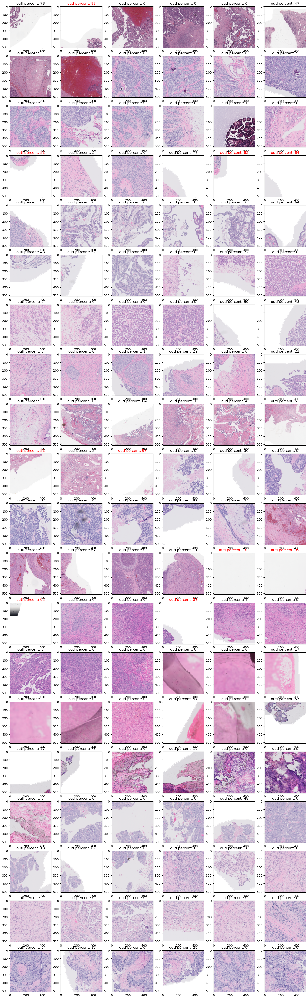

In [8]:
nrows = 20
ncols = 6

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*3, nrows*3))
for i, row in tiles_df_sample.iterrows():
    if i >= (nrows*ncols):
        break
    img_path = os.path.join(tiles_dir, str(row['orig_image_id']), str(row['image_id'] + '.png'))
    # img = plt.imread(img_path)
    img = pyvips.Image.new_from_file(img_path).numpy()
    # if np.max(img) > 1.5:
    #     img = img / 255.0
    ax = axes[i // ncols, i % ncols]
    ax.set_title(row['label'])
    mean_pixels = img.mean(2).flatten()
    outl_perc = (sum(mean_pixels > (240)) + sum(mean_pixels < (0.05*255)))/len(mean_pixels)*100
    if outl_perc > 80: c = 'red' 
    else: c = 'black'
    ax.set_title(f'outl percent: {outl_perc:.0f}', fontdict={'color': c})
    ax.imshow(img)